# Timing Strategy Calibration

Goal: identify the Pareto-efficient timing strategy parameters to use in Phase 1.

## Method
Replicates Mariska's (2024) parameter space across all three strategy types:
- **Baseline**: FCFS only (periodic RF=100,000s — solver never fires)
- **Periodic**: 5 values of periodic_rf
- **Event-Driven**: 32 combinations of event_driven_rf x controller_freq x threshold_confidence
- **Hybrid**: 48 combinations adding periodic_rf

All runs use:
- No priority (weight_passenger=1, weight_freight=1)
- Objective: final_delay
- Freight: 15% (N_FREIGHT=182)
- GAMMA: calibrated value from calibrate_gamma.ipynb
- 50 seeds per configuration

## Output
One folder per configuration under `results/calibration/timing/`:
- `<config_name>_seed<N>.parquet` — full df per seed, for reanalysis
- `raw_runs.csv` — metrics per seed
- `aggregated.csv` — mean and std over all seeds

The folder name is built by `run_simulation._build_config_name` and is
strategy-specific (no irrelevant parameters included).

## Resuming after interruption
Completed configurations are skipped automatically based on `aggregated.csv`.
To rerun a configuration: delete its folder under `results/calibration/timing/`.

## Selection criterion
Pareto-efficient strategies on TED_combined vs total_solve_time.
The best-of-type strategy per strategy type is carried forward to Phase 1.


## Setup

In [5]:
import sys
from pathlib import Path

sys.path.append(str(Path.cwd().parent))

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from run_simulation import run_simulation
from utils.metrics import (
    compute_metrics, build_result_row,
    save_result_row, aggregate_config, load_all_aggregated
)

print('Imports OK')

Imports OK


## Parameters

In [6]:
# --- Fixed parameters ---
N_FREIGHT          = 182     # 15% of total fleet
FREIGHT_PCT        = 0.15
N_RUNS             = 30      # seeds per configuration
GAMMA              = 180     # s — calibrated from calibrate_gamma.ipynb
MC_DELAY_PER_TRAIN = 10      # s — per active train MC threshold
SOLVER_TIMEOUT     = 60      # s
OBJECTIVE          = 'static'  # no priority, final_delay objective
WEIGHT_PASSENGER   = 1
WEIGHT_FREIGHT     = 1

# --- Output ---
RESULTS_DIR = Path('../results/calibration/timing')
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

print(f'N_RUNS:             {N_RUNS}')
print(f'N_FREIGHT:          {N_FREIGHT}')
print(f'GAMMA:              {GAMMA}s')
print(f'MC_DELAY_PER_TRAIN: {MC_DELAY_PER_TRAIN}s')
print(f'Results dir:        {RESULTS_DIR.resolve()}')

N_RUNS:             30
N_FREIGHT:          182
GAMMA:              180s
MC_DELAY_PER_TRAIN: 10s
Results dir:        /Users/ddw/Desktop/Rescheduling/results/calibration/timing


## Configuration Grid

Each config dict maps directly to `run_simulation()` keyword arguments.
Derived from Table 8 in Vande Sompele (2024).

Note: `event_driven_freq`, `controller_freq`, `periodic_freq` and
`threshold_confidence` default to the values in `run_simulation.py`
when not overridden — we always pass them explicitly for clarity.

In [7]:
configs = []

# -----------------------------------------------------------------------
# Baseline — FCFS only, solver never fires
# -----------------------------------------------------------------------
configs.append({
    'trigger_strategy':     'periodic',
    'periodic_freq':        100_000,
    'event_driven_freq':    900,      # unused but required by run_simulation signature
    'controller_freq':      300,      # unused
    'threshold_confidence': 0.6,      # unused
})

# -----------------------------------------------------------------------
# Periodic — 5 values
# -----------------------------------------------------------------------
for prf in [900, 1800, 3600, 5400, 7200]:
    configs.append({
        'trigger_strategy':     'periodic',
        'periodic_freq':        prf,
        'event_driven_freq':    900,   # unused
        'controller_freq':      300,   # unused
        'threshold_confidence': 0.6,   # unused
    })

# -----------------------------------------------------------------------
# Event-Driven — 32 combinations
# -----------------------------------------------------------------------
ed_rf_cf_map = {
    900:  [450, 900],
    1800: [450, 900, 1800],
    3600: [900, 1800, 3600],
    5400: [1800, 3600, 5400],
}
tc_values = [0.4, 0.6, 0.8]

for ed_rf, cf_list in ed_rf_cf_map.items():
    for cf in cf_list:
        for tc in tc_values:
            configs.append({
                'trigger_strategy':     'event_driven',
                'event_driven_freq':    ed_rf,
                'controller_freq':      cf,
                'threshold_confidence': tc,
                'periodic_freq':        100_000,  # unused for event_driven
            })

# -----------------------------------------------------------------------
# Hybrid — 48 combinations
# (event_driven_rf, controller_freq, periodic_rf)
# -----------------------------------------------------------------------
hybrid_combos = [
    (1800, 900,  3600), (1800, 1800, 3600),
    (1800, 900,  5400), (1800, 1800, 5400),
    (1800, 900,  7200), (1800, 1800, 7200),
    (3600, 900,  5400), (3600, 1800, 5400), (3600, 3600, 5400),
    (3600, 900,  7200), (3600, 1800, 7200), (3600, 3600, 7200),
    (5400, 900,  7200), (5400, 1800, 7200),
]

for ed_rf, cf, prf in hybrid_combos:
    for tc in tc_values:
        configs.append({
            'trigger_strategy':     'hybrid',
            'event_driven_freq':    ed_rf,
            'controller_freq':      cf,
            'periodic_freq':        prf,
            'threshold_confidence': tc,
        })

n_baseline     = sum(1 for c in configs if c['trigger_strategy'] == 'periodic' and c['periodic_freq'] == 100_000)
n_periodic     = sum(1 for c in configs if c['trigger_strategy'] == 'periodic' and c['periodic_freq'] != 100_000)
n_event_driven = sum(1 for c in configs if c['trigger_strategy'] == 'event_driven')
n_hybrid       = sum(1 for c in configs if c['trigger_strategy'] == 'hybrid')

print(f'Total configurations: {len(configs)}')
print(f'  Baseline:     {n_baseline}')
print(f'  Periodic:     {n_periodic}')
print(f'  Event-Driven: {n_event_driven}')
print(f'  Hybrid:       {n_hybrid}')
print(f'\nTotal runs: {len(configs)} x {N_RUNS} = {len(configs) * N_RUNS}')

Total configurations: 81
  Baseline:     1
  Periodic:     5
  Event-Driven: 33
  Hybrid:       42

Total runs: 81 x 30 = 2430


## Run All Configurations

For each configuration:
1. Call `run_simulation(save=True)` — parquet saved per seed, `config_dir` returned
2. Compute metrics from `df` via `compute_metrics`
3. Append metrics row to `raw_runs.csv` via `save_result_row`
4. After all seeds: aggregate to `aggregated.csv` via `aggregate_config`

Skip logic: if `aggregated.csv` already exists in the config folder,
that configuration is skipped. Safe to interrupt and restart.

In [8]:
for config_idx, cfg in enumerate(configs):

    # Build run_simulation kwargs from config dict
    sim_kwargs = dict(
        n_freight            = N_FREIGHT,
        trigger_strategy     = cfg['trigger_strategy'],
        event_driven_freq    = cfg['event_driven_freq'],
        controller_freq      = cfg['controller_freq'],
        periodic_freq        = cfg['periodic_freq'],
        threshold_confidence = cfg['threshold_confidence'],
        objective_strategy   = OBJECTIVE,
        weight_passenger     = WEIGHT_PASSENGER,
        weight_freight       = WEIGHT_FREIGHT,
        dynamic_threshold    = GAMMA,
        output_dir           = RESULTS_DIR,
        save                 = True,
    )

    # Determine config_dir by doing a dry seed=0 call to get the name,
    # then check if aggregated.csv already exists — skip if so.
    # We infer the config dir from the first seed's return value.
    # If aggregated.csv exists inside any matching subfolder, skip.
    # Simple and robust: just check seed 0 parquet existence.
    # Build expected config_dir using same logic as run_simulation
    from run_simulation import _build_config_name
    params_check = {
        'n_freight':           N_FREIGHT,
        'trigger_strategy':    cfg['trigger_strategy'],
        'event_driven_freq':   cfg['event_driven_freq'],
        'controller_freq':     cfg['controller_freq'],
        'periodic_freq':       cfg['periodic_freq'],
        'threshold_confidence':cfg['threshold_confidence'],
        'objective_strategy':  OBJECTIVE,
        'weight_passenger':    WEIGHT_PASSENGER,
        'weight_freight':      WEIGHT_FREIGHT,
        'dynamic_threshold':   GAMMA,
        'seed':                0,
    }
    config_dir = RESULTS_DIR / _build_config_name(params_check)

    # Skip volledige configuratie indien map al bestaat
    if config_dir.exists():
        print(f'[{config_idx+1}/{len(configs)}] SKIP: {config_dir.name} already exists')
        continue

    # Anders map aanmaken
    config_dir.mkdir(parents=True, exist_ok=True)

    print(f'\n[{config_idx+1}/{len(configs)}] Running: {config_dir.name}')

    for seed in range(N_RUNS):
        state, df, meta, config_dir = run_simulation(seed=seed, **sim_kwargs)

        if meta["deadlock_detected"]:
            print(f"  Seed {seed} → DEADLOCK (uitgesloten van analyse)")
            # Sla een marker op zodat je weet welke seeds deadlockten
            deadlock_row = build_result_row(
                seed               = seed,
                phase              = 0,
                metrics            = {"TED_combined": None, "TED_passenger": None,
                                    "TED_freight": None, "delay_ratio": None},
                meta               = meta,
                strategy_type      = cfg['trigger_strategy'],
                periodic_rf        = cfg['periodic_freq']        if cfg['trigger_strategy'] != 'event_driven' else None,
                event_driven_rf    = cfg['event_driven_freq']    if cfg['trigger_strategy'] != 'periodic'     else None,
                controller_freq    = cfg['controller_freq']      if cfg['trigger_strategy'] != 'periodic'     else None,
                threshold_conf     = cfg['threshold_confidence'] if cfg['trigger_strategy'] != 'periodic'     else None,
                priority           = 'no_priority',
                weight_passenger   = WEIGHT_PASSENGER,
                weight_freight     = WEIGHT_FREIGHT,
                gamma              = GAMMA,
                objective          = 'final_delay',
                freight_pct        = FREIGHT_PCT,
                mc_delay_per_train = MC_DELAY_PER_TRAIN,
                solver_timeout     = SOLVER_TIMEOUT,
            )
            # Voeg deadlock marker toe aan de row voor traceerbaarheid
            deadlock_row["deadlock"] = True
            save_result_row(deadlock_row, config_dir=config_dir)
            continue

        metrics = compute_metrics(df)
        row = build_result_row(
            seed               = seed,
            phase              = 0,
            metrics            = metrics,
            meta               = meta,
            strategy_type      = cfg['trigger_strategy'],
            periodic_rf        = cfg['periodic_freq']        if cfg['trigger_strategy'] != 'event_driven' else None,
            event_driven_rf    = cfg['event_driven_freq']    if cfg['trigger_strategy'] != 'periodic'     else None,
            controller_freq    = cfg['controller_freq']      if cfg['trigger_strategy'] != 'periodic'     else None,
            threshold_conf     = cfg['threshold_confidence'] if cfg['trigger_strategy'] != 'periodic'     else None,
            priority           = 'no_priority',
            weight_passenger   = WEIGHT_PASSENGER,
            weight_freight     = WEIGHT_FREIGHT,
            gamma              = GAMMA,
            objective          = 'final_delay',
            freight_pct        = FREIGHT_PCT,
            mc_delay_per_train = MC_DELAY_PER_TRAIN,
            solver_timeout     = SOLVER_TIMEOUT,
        )
        row["deadlock"] = False
        save_result_row(row, config_dir=config_dir)

        if (seed + 1) % 10 == 0:
            print(f'  Seed {seed + 1}/{N_RUNS} completed')

    aggregate_config(config_dir)
    print(f'  Aggregated -> {config_dir.name}')

print('\nAll configurations completed.')

[1/81] SKIP: n182_periodic_static_wp1_wf1_pf100000 already exists
[2/81] SKIP: n182_periodic_static_wp1_wf1_pf900 already exists
[3/81] SKIP: n182_periodic_static_wp1_wf1_pf1800 already exists
[4/81] SKIP: n182_periodic_static_wp1_wf1_pf3600 already exists
[5/81] SKIP: n182_periodic_static_wp1_wf1_pf5400 already exists
[6/81] SKIP: n182_periodic_static_wp1_wf1_pf7200 already exists
[7/81] SKIP: n182_event_driven_static_wp1_wf1_edf900_cf450_tc0.4 already exists
[8/81] SKIP: n182_event_driven_static_wp1_wf1_edf900_cf450_tc0.6 already exists
[9/81] SKIP: n182_event_driven_static_wp1_wf1_edf900_cf450_tc0.8 already exists
[10/81] SKIP: n182_event_driven_static_wp1_wf1_edf900_cf900_tc0.4 already exists
[11/81] SKIP: n182_event_driven_static_wp1_wf1_edf900_cf900_tc0.6 already exists
[12/81] SKIP: n182_event_driven_static_wp1_wf1_edf900_cf900_tc0.8 already exists
[13/81] SKIP: n182_event_driven_static_wp1_wf1_edf1800_cf450_tc0.4 already exists
[14/81] SKIP: n182_event_driven_static_wp1_wf1_edf

## Load All Results

In [23]:
df_results = load_all_aggregated(RESULTS_DIR)

# Separate baseline for reference line
df_baseline = df_results[
    (df_results['strategy_type'] == 'periodic') &
    (df_results['periodic_rf'] == 100_000)
]
df_strategies = df_results[
    ~((df_results['strategy_type'] == 'periodic') &
      (df_results['periodic_rf'] == 100_000))
]

print(f'Configurations loaded: {len(df_results)}')
print(f'  Baseline:     {len(df_baseline)}')
print(f'  Strategies:   {len(df_strategies)}')

Configurations loaded: 81
  Baseline:     1
  Strategies:   80


## Pareto Analysis

Identify Pareto-efficient strategies on TED_combined_mean vs total_solve_time_mean.
A strategy is Pareto-efficient if no other strategy is better on both metrics simultaneously.

In [24]:
def is_pareto_efficient(df, x_col, y_col):
    """Returns boolean list — True if row is Pareto-efficient (minimise both)."""
    vals = df[[x_col, y_col]].values
    efficient = []
    for i, (xi, yi) in enumerate(vals):
        dominated = any(
            vals[j, 0] <= xi and vals[j, 1] <= yi and
            (vals[j, 0] < xi or vals[j, 1] < yi)
            for j in range(len(vals)) if j != i
        )
        efficient.append(not dominated)
    return efficient

df_strategies = df_strategies.copy()
df_strategies['pareto'] = is_pareto_efficient(
    df_strategies, 'TED_combined_mean', 'total_solve_time_mean'
)

print(f'Pareto-efficient strategies: {df_strategies["pareto"].sum()} of {len(df_strategies)}')
print()
print(df_strategies[df_strategies['pareto']][
    ['strategy_type', 'periodic_rf', 'event_driven_rf',
     'controller_freq', 'threshold_conf',
     'TED_combined_mean', 'total_solve_time_mean']
].sort_values('TED_combined_mean').to_string(index=False))

Pareto-efficient strategies: 10 of 80

strategy_type  periodic_rf  event_driven_rf  controller_freq  threshold_conf  TED_combined_mean  total_solve_time_mean
     periodic        900.0              NaN              NaN             NaN       75025.314753               0.671620
       hybrid       5400.0           1800.0            900.0             0.8       78748.916667               0.363279
       hybrid       7200.0           1800.0           1800.0             0.8       78915.493333               0.348551
       hybrid       3600.0           1800.0           1800.0             0.8       78955.730000               0.341925
       hybrid       7200.0           5400.0           1800.0             0.8       79722.527586               0.127381
       hybrid       7200.0           5400.0           1800.0             0.6       80651.126667               0.123687
 event_driven          NaN           5400.0           1800.0             0.8       81423.526667               0.122559
 event_dr

## Pareto Plot

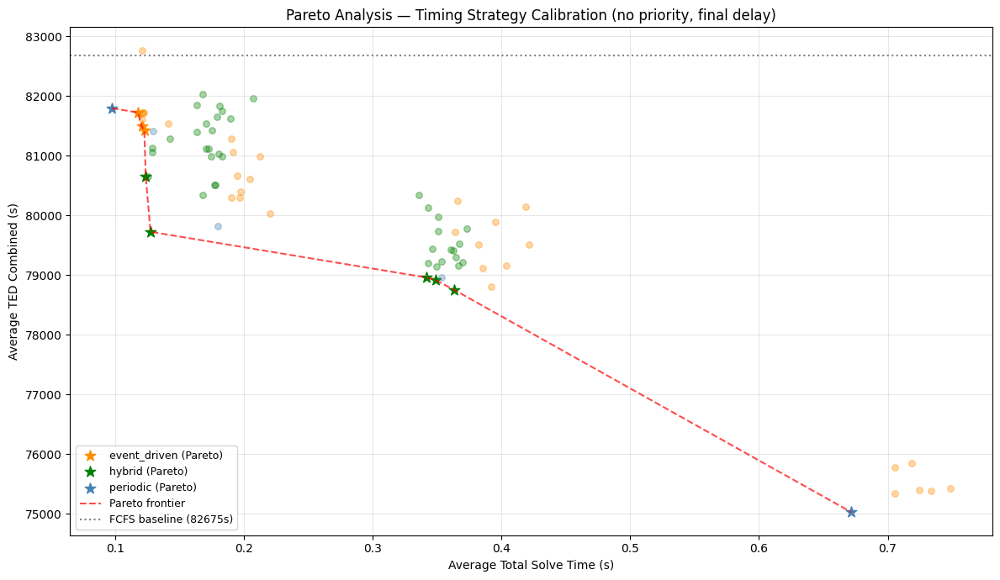

Figure saved: ../results/calibration/timing/pareto_timing_calibration.png


In [25]:
fig, ax = plt.subplots(figsize=(12, 7))

colors = {
    'periodic':     'steelblue',
    'event_driven': 'darkorange',
    'hybrid':       'green',
}

for strategy, group in df_strategies.groupby('strategy_type'):
    color      = colors.get(strategy, 'black')
    non_pareto = group[~group['pareto']]
    pareto     = group[group['pareto']]

    if len(non_pareto) > 0:
        ax.scatter(
            non_pareto['total_solve_time_mean'],
            non_pareto['TED_combined_mean'],
            color=color, alpha=0.35, s=30,
        )
    if len(pareto) > 0:
        ax.scatter(
            pareto['total_solve_time_mean'],
            pareto['TED_combined_mean'],
            color=color, alpha=1.0, s=90, marker='*',
            label=f'{strategy} (Pareto)',
        )

# Pareto frontier line
pareto_sorted = df_strategies[df_strategies['pareto']].sort_values('total_solve_time_mean')
ax.plot(
    pareto_sorted['total_solve_time_mean'],
    pareto_sorted['TED_combined_mean'],
    color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='Pareto frontier'
)

# FCFS baseline horizontal line
if len(df_baseline) > 0:
    baseline_ted = df_baseline['TED_combined_mean'].values[0]
    ax.axhline(
        baseline_ted, color='grey', linestyle=':',
        linewidth=1.5, label=f'FCFS baseline ({baseline_ted:.0f}s)'
    )

ax.set_xlabel('Average Total Solve Time (s)')
ax.set_ylabel('Average TED Combined (s)')
ax.set_title('Pareto Analysis — Timing Strategy Calibration (no priority, final delay)')
ax.legend(fontsize=9)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(RESULTS_DIR / 'pareto_timing_calibration.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Figure saved: {RESULTS_DIR / "pareto_timing_calibration.png"}')

## Interactive

In [26]:
import plotly.graph_objects as go

fig = go.Figure()

colors = {
    'periodic':     'steelblue',
    'event_driven': 'darkorange',
    'hybrid':       'green',
}


def build_customdata(df):
    return list(zip(
        df['strategy_type'],
        df['periodic_rf'],
        df['event_driven_rf'],
        df['controller_freq'],
        df['threshold_conf'],
    ))


for strategy, group in df_strategies.groupby('strategy_type'):

    color = colors.get(strategy, 'black')

    non_pareto = group[~group['pareto']]
    pareto     = group[group['pareto']]

    # Non-Pareto points
    if len(non_pareto) > 0:

        fig.add_trace(go.Scatter(
            x=non_pareto['total_solve_time_mean'],
            y=non_pareto['TED_combined_mean'],

            mode='markers',

            marker=dict(
                color=color,
                size=7,
                opacity=0.35,
            ),

            name=f'{strategy}',

            customdata=build_customdata(non_pareto),

            hovertemplate=
                "<b>%{customdata[0]}</b><br>" +
                "TED: %{y:.0f}s<br>" +
                "Solve time: %{x:.3f}s<br>" +
                "Periodic freq: %{customdata[1]}<br>" +
                "EDF: %{customdata[2]}<br>" +
                "Controller freq: %{customdata[3]}<br>" +
                "Threshold conf: %{customdata[4]}<br>" +
                "<extra></extra>"
        ))

    # Pareto points
    if len(pareto) > 0:

        fig.add_trace(go.Scatter(
            x=pareto['total_solve_time_mean'],
            y=pareto['TED_combined_mean'],

            mode='markers',

            marker=dict(
                color=color,
                size=14,
                symbol='star',
            ),

            name=f'{strategy} (Pareto)',

            customdata=build_customdata(pareto),

            hovertemplate=
                "<b>%{customdata[0]} — Pareto</b><br>" +
                "TED: %{y:.0f}s<br>" +
                "Solve time: %{x:.3f}s<br>" +
                "Periodic freq: %{customdata[1]}<br>" +
                "EDF: %{customdata[2]}<br>" +
                "Controller freq: %{customdata[3]}<br>" +
                "Threshold conf: %{customdata[4]}<br>" +
                "<extra></extra>"
        ))


# Pareto frontier line
pareto_sorted = (
    df_strategies[df_strategies['pareto']]
    .sort_values('total_solve_time_mean')
)

fig.add_trace(go.Scatter(
    x=pareto_sorted['total_solve_time_mean'],
    y=pareto_sorted['TED_combined_mean'],

    mode='lines',

    line=dict(
        color='red',
        dash='dash',
        width=2,
    ),

    name='Pareto frontier',

    hoverinfo='skip'
))


# FCFS baseline
if len(df_baseline) > 0:

    baseline_ted = df_baseline['TED_combined_mean'].values[0]

    fig.add_hline(
        y=baseline_ted,

        line_dash='dot',
        line_color='grey',

        annotation_text=f'FCFS baseline ({baseline_ted:.0f}s)',
        annotation_position='top right'
    )


# Layout
fig.update_layout(
    title='Pareto Analysis — Timing Strategy Calibration',

    xaxis_title='Average Total Solve Time (s)',
    yaxis_title='Average TED Combined (s)',

    template='plotly_white',

    width=1100,
    height=700,

    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    ),
)

fig.show()

In [34]:
evaluation = df_results.copy()

evaluation = evaluation.sort_values('TED_combined_mean')

cols = [

    'strategy_type',
    'periodic_rf',
    'event_driven_rf',
    'controller_freq',
    'threshold_conf',

    # Performance
    'TED_combined_mean',
    'TED_combined_std',

    # Runtime
    'total_solve_time_mean',
    'total_solve_time_std',

    # Robustness
    'n_deadlocks',
    'n_infeasible',

    # Controller behaviour
    'n_rescheduled_mean',
    'n_fcfs_fallback_mean',
    'n_skipped_mean',

]

display(
    evaluation[cols].round(3)
)

,strategy_type,periodic_rf,event_driven_rf,controller_freq,threshold_conf,TED_combined_mean,TED_combined_std,total_solve_time_mean,total_solve_time_std,n_deadlocks,n_infeasible,n_rescheduled_mean,n_fcfs_fallback_mean,n_skipped_mean
80,periodic,900.0,NaN,NaN,NaN,75025.315,3210.548,0.672,0.028,0,0,93.833,0.0,10712.167
29,event_driven,NaN,900.0,450.0,0.8,75337.317,3059.979,0.706,0.037,0,0,79.300,0.0,10726.700
31,event_driven,NaN,900.0,900.0,0.6,75386.764,3891.298,0.733,0.142,0,0,76.200,0.0,10729.800
32,event_driven,NaN,900.0,900.0,0.8,75392.408,3888.660,0.725,0.142,0,0,75.300,0.0,10730.700
30,event_driven,NaN,900.0,900.0,0.4,75429.924,3400.960,0.749,0.053,0,0,80.967,0.0,10725.033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,hybrid,5400.0,3600.0,900.0,0.6,81848.340,3233.692,0.163,0.015,0,0,23.067,0.0,10782.933
60,hybrid,7200.0,3600.0,3600.0,0.4,81958.053,3614.452,0.207,0.030,0,0,22.300,0.0,10783.700
65,hybrid,5400.0,3600.0,900.0,0.8,82035.083,3182.075,0.168,0.022,0,0,23.033,0.0,10782.967
75,periodic,100000.0,NaN,NaN,NaN,82674.763,3634.708,0.000,0.000,0,0,0.000,0.0,10806.000


In [31]:
print(df_results.columns.tolist())

['phase', 'strategy_type', 'periodic_rf', 'event_driven_rf', 'controller_freq', 'threshold_conf', 'priority', 'weight_passenger', 'weight_freight', 'gamma', 'upgrade', 'objective', 'freight_pct', 'mc_delay_per_train', 'solver_timeout', 'n_runs', 'n_complete', 'n_deadlocks', 'n_infeasible', 'TED_passenger_mean', 'TED_passenger_std', 'TED_freight_mean', 'TED_freight_std', 'TED_combined_mean', 'TED_combined_std', 'TAD_passenger_mean', 'TAD_passenger_std', 'TAD_freight_mean', 'TAD_freight_std', 'TAD_combined_mean', 'TAD_combined_std', 'delay_ratio_mean', 'delay_ratio_std', 'total_solve_time_mean', 'total_solve_time_std', 'n_rescheduled_mean', 'n_rescheduled_std', 'n_fcfs_fallback_mean', 'n_fcfs_fallback_std', 'n_skipped_mean', 'n_skipped_std', 'config_dir']


## Select Best Strategy Per Type for Phase 1

From the Pareto-efficient set, select the best strategy per type
based on lowest TED_combined_mean. These three go forward to Phase 1.

In [ ]:
best_per_type = (
    df_strategies[df_strategies['pareto']]
    .sort_values('TED_combined_mean')
    .groupby('strategy_type')
    .first()
    .reset_index()
)

print('=' * 60)
print('BEST PARETO-EFFICIENT STRATEGY PER TYPE')
print('=' * 60)

for _, row in best_per_type.iterrows():
    print(f"\n{row['strategy_type'].upper()}")
    if row['strategy_type'] == 'periodic':
        print(f"  periodic_rf:      {row['periodic_rf']}")
    elif row['strategy_type'] == 'event_driven':
        print(f"  event_driven_rf:  {row['event_driven_rf']}")
        print(f"  controller_freq:  {row['controller_freq']}")
        print(f"  threshold_conf:   {row['threshold_conf']}")
    elif row['strategy_type'] == 'hybrid':
        print(f"  event_driven_rf:  {row['event_driven_rf']}")
        print(f"  controller_freq:  {row['controller_freq']}")
        print(f"  periodic_rf:      {row['periodic_rf']}")
        print(f"  threshold_conf:   {row['threshold_conf']}")
    print(f"  TED_combined:     {row['TED_combined_mean']:.1f}s  (std={row['TED_combined_std']:.1f}s)")
    print(f"  solve_time:       {row['total_solve_time_mean']:.2f}s")

# Save
best_per_type.to_csv(RESULTS_DIR / 'best_per_type.csv', index=False)
print(f'\nSaved: {RESULTS_DIR / "best_per_type.csv"}')
print('\nCopy these parameters into Phase 1 notebook as TIMING_CONFIGS.')

BEST PARETO-EFFICIENT STRATEGY PER TYPE

EVENT_DRIVEN
  event_driven_rf:  5400.0
  controller_freq:  1800.0
  threshold_conf:   0.8
  TED_combined:     81423.5s  (std=3711.9s)
  solve_time:       0.12s

HYBRID
  event_driven_rf:  1800.0
  controller_freq:  900.0
  periodic_rf:      5400.0
  threshold_conf:   0.8
  TED_combined:     78748.9s  (std=3576.3s)
  solve_time:       0.36s

PERIODIC
  periodic_rf:      900.0
  TED_combined:     75025.3s  (std=3210.5s)
  solve_time:       0.67s

Saved: ../results/calibration/timing/best_per_type.csv

Copy these parameters into Phase 1 notebook as TIMING_CONFIGS.
